## Lab Assignment 2 - Michaela Cooney


#### 210013771

#### Part 1: Python Basics

In [1]:
from arcgis.gis import GIS
gis = GIS("home")

#### Task 1

In [2]:
my_value = 15

if my_value % 3 == 0:
    print(f"{my_value} is divisible by 3")
else:
    print(f"{my_value} is not divisible by 3")

15 is divisible by 3


#### Task 2 

In [3]:
my_fruit = "banana"

acceptable_fruits = ["apple", "orange", "pear", "kiwi", "strawberry"]

if my_fruit.lower() in acceptable_fruits:
    print(f"{my_fruit.capitalize()} is acceptable")
else:
    print(f"{my_fruit.capitalize()} is not acceptable")

    ### your_fruit.lower() is used to convert the input string to lowercase, ensuring that the comparison is case-insensitive.

Banana is not acceptable


#### Task 3 

In [4]:
import math

def haversine_distance(lat1, lon1, lat2, lon2):
    R = 6371.0 #radius of the Earth in km 

    #latitude and longitude from degrees to radians
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)

    #differences in coordinates
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad

    #Haversine formula
    a = math.sin(dlat / 2)**2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon / 2)**2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))

    #distance equation
    distance = R * c

    return distance

#coordinates for Vancouver, BC, CA
latitude1, longitude1 = 49.2827, - 123.1207
#coordinates for Vancouver, WA, US
latitude2, longitude2 = 45.6387, - 122.6615

distance = haversine_distance(latitude1, longitude1, latitude2, longitude2)
print(f"The distance between the two coordinates is {distance:.2f} kilometers.")

The distance between the two coordinates is 406.66 kilometers.


#### Part 2: Pandas and NumPy

In [5]:
import numpy as np
import pandas as pd

In [6]:
import matplotlib.pyplot as plt

In [7]:
dataset = '/arcgis/home/portland_park_trees.csv'

In [8]:
file_path = '/arcgis/home/portland_park_trees.csv'
df = pd.read_csv(file_path) #df = dataframe 

#### Task 1

In [9]:
genus_counts = df['Genus'].value_counts()
print(genus_counts)

Genus
Pseudotsuga      6783
Acer             3586
Quercus          2089
Prunus           1333
Pinus             983
                 ... 
Machilus            1
Eucommia            1
Azara               1
Phellodendron       1
Laburnum            1
Name: count, Length: 117, dtype: int64


In [10]:
specific_genus_count = genus_counts['Quercus']
print(genus_counts)
###seem to give the exact same answer as the code above 

Genus
Pseudotsuga      6783
Acer             3586
Quercus          2089
Prunus           1333
Pinus             983
                 ... 
Machilus            1
Eucommia            1
Azara               1
Phellodendron       1
Laburnum            1
Name: count, Length: 117, dtype: int64


#### Answer to Question 1: 
There are 2089 trees of the Quercus genus and 3586 trees of the Acer genus

#### Question 2: How many trees are of the Quercus or Acer genus and have a DBH larger than 50inches? 

In [11]:
#dataframe being filtered based on genus and DBH
filtered_df = df[(df['Genus'].isin(['Quercus'])) & (df['DBH'] > 50)]
number_of_trees = len(filtered_df)
print(f"The number of trees of the Quercus genus with DBH > 50 inches is: {number_of_trees}")

The number of trees of the Quercus genus with DBH > 50 inches is: 80


In [12]:
#a repeat of the above, for Acer genus 
filtered_df = df[(df['Genus'].isin(['Acer'])) & (df['DBH'] > 50)]
number_of_trees = len(filtered_df)
print(f"The number of trees of the Acer genus with DBH > 50 inches is: {number_of_trees}")

The number of trees of the Acer genus with DBH > 50 inches is: 44


#### Question 3: Which genus has the highest mean DBH of the following genera: Quercus, Acer, or Fraxinus?

In [13]:
selected_genera = ['Quercus', 'Acer', 'Fraxinus']
filtered_df = df[df['Genus'].isin(selected_genera)]

#calculating DBH by genus
genus_mean_dbh = filtered_df.groupby('Genus')['DBH'].mean()

#genus with the highest mean DBH
max_mean_genus = genus_mean_dbh.idxmax()
max_mean_dbh = genus_mean_dbh.max()

print(f"The genus with the highest mean DBH among {', '.join(selected_genera)} is {max_mean_genus} with a mean DBH of {max_mean_dbh:.2f} inches.")

The genus with the highest mean DBH among Quercus, Acer, Fraxinus is Quercus with a mean DBH of 23.57 inches.


#### Question 4: How many different species of trees are recorded in Acer genus?

In [14]:
acer_df = df[df['Genus'] == 'Acer']

num_species = acer_df['Genus_spec'].nunique()

print(f"The number of different species of trees recorded in the Acer genus is: {num_species}")

The number of different species of trees recorded in the Acer genus is: 20


#### Question 5: 

In [15]:
dataset = '/arcgis/home/world_cities.csv'

In [16]:
file_path = '/arcgis/home/world_cities.csv'
df = pd.read_csv(file_path) #df = dataframe 

In [17]:
#creating the new column pop_M (M for Michaela)
df['pop_M'] = df['pop'] / 1000000

In [18]:
#deleting the pop column 
df = df.drop(columns=['pop'])

In [19]:
print(df)

                     city       country    lat    lon  capital     pop_M
0      'Abasan al-Jadidah     Palestine  31.31  34.34        0  0.005629
1      'Abasan al-Kabirah     Palestine  31.32  34.35        0  0.018999
2            'Abdul Hakim      Pakistan  30.55  72.11        0  0.047788
3      'Abdullah-as-Salam        Kuwait  29.36  47.98        0  0.021817
4                   'Abud     Palestine  32.03  35.07        0  0.002456
...                   ...           ...    ...    ...      ...       ...
43640           az-Zubayr          Iraq  30.39  47.71        0  0.124611
43641            az-Zulfi  Saudi Arabia  26.30  44.80        0  0.054070
43642       az-Zuwaytinah         Libya  30.95  20.12        0  0.021984
43643        s-Gravenhage   Netherlands  52.07   4.30        0  0.479525
43644     s-Hertogenbosch   Netherlands  51.68   5.30        0  0.135529

[43645 rows x 6 columns]


In [20]:
#choosing Mogadishu, Somalia, as my city to subset
##code to find the 5 cities with the largest populations in Somalia 

somalia_cities = df[df['country'] == 'Somalia']

#df sorting population in descending order
somalia_cities_sorted = somalia_cities.sort_values(by='pop_M', ascending=False)

#top 5 cities with the largest populations
top_five_cities = somalia_cities_sorted.head(5)

print(top_five_cities)

            city  country    lat    lon  capital     pop_M
24186  Mogadishu  Somalia   2.05  45.33        1  2.723378
13898   Hargeysa  Somalia   9.56  44.06        0  0.500710
22828      Marka  Somalia   1.72  44.76        0  0.335758
4036     Berbera  Somalia  10.44  45.00        0  0.252538
18262    Kismayo  Somalia  -0.35  42.53        0  0.245636


### Part 3: Python Data Visualization

In [21]:
#back to the portland_park_trees dataset 
dataset = '/arcgis/home/portland_park_trees.csv'

In [22]:
file_path = '/arcgis/home/portland_park_trees.csv'
df = pd.read_csv(file_path) #df = dataframe 

In [23]:
import matplotlib.pyplot as plt

#### Graph 1

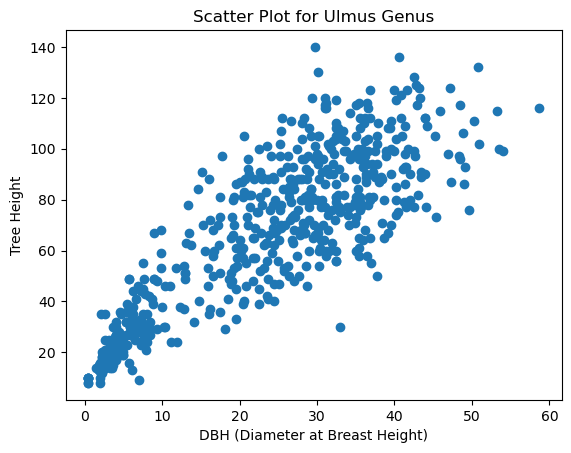

In [24]:
#scatterplot for trees in Ulmus genus only, for DBH and Tree height

ulmus_df = df[df['Genus'] == 'Ulmus']

#scatterplot
plt.scatter(ulmus_df['DBH'], ulmus_df['TreeHeight'])

#add labels + title
plt.xlabel('DBH (Diameter at Breast Height)')
plt.ylabel('Tree Height')
plt.title('Scatter Plot for Ulmus Genus')

plt.show()

#### Graph 2

In [25]:
#scatterplot as above, but with tree species mapped to hue
import seaborn as sns

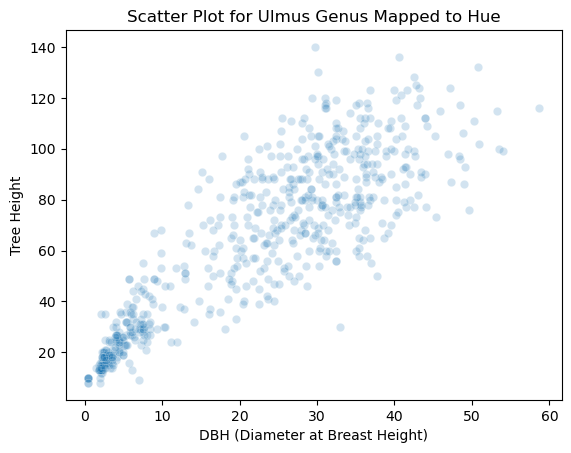

In [26]:
ulmus_df = df[df['Genus'] == 'Ulmus']

#scatterplot
sns.scatterplot(x='DBH', y='TreeHeight', data=ulmus_df, alpha= 0.2)

#add labels + title
plt.xlabel('DBH (Diameter at Breast Height)')
plt.ylabel('Tree Height')
plt.title('Scatter Plot for Ulmus Genus Mapped to Hue')

plt.show()

#### Graph 3 

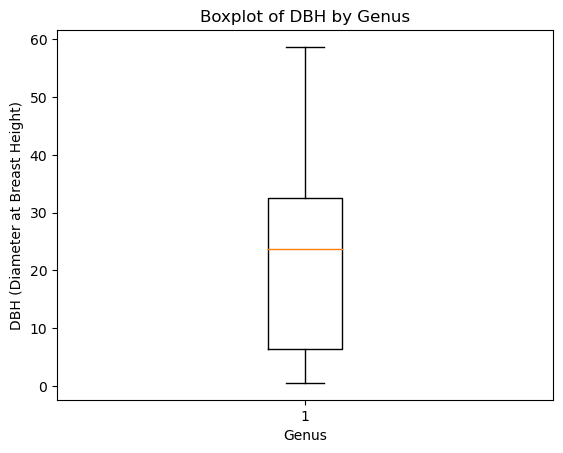

In [27]:
#boxplot of DBH just for Ulmus 
ulmus_df = df[df['Genus'] == 'Ulmus']

#boxplot 
plt.boxplot(ulmus_df['DBH'])

#labels and title 
plt.xlabel('Genus')
plt.ylabel('DBH (Diameter at Breast Height)')
plt.title('Boxplot of DBH by Genus') 

#Showing the boxplot
plt.show()


#### Graph 4: 

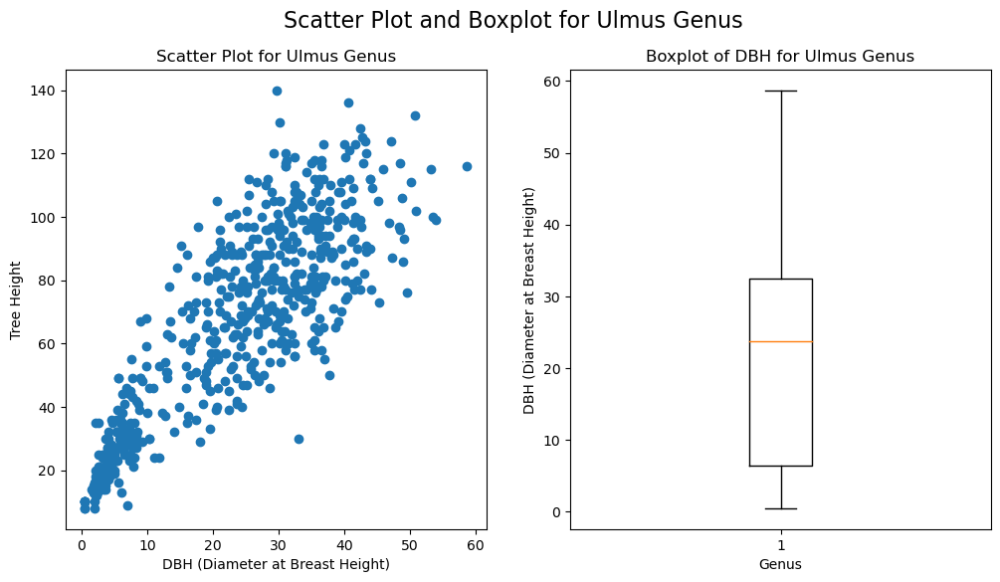

In [28]:
#combining the scatterplot and boxplot into one figure using matplotlib and pandas 

fig, axes = plt.subplots(1, 2, figsize=(12, 6)) # 1, 2 = one row and two columns to produce two graphs in one row
#sets the figure at a height of 6 inches and width of 12 

#figure title 
fig.suptitle('Scatter Plot and Boxplot for Ulmus Genus', fontsize=16)

#first the scatterplot (axes 0)
axes[0].scatter(df[df['Genus'] == 'Ulmus']['DBH'], df[df['Genus'] == 'Ulmus']['TreeHeight'])
axes[0].set_xlabel('DBH (Diameter at Breast Height)')
axes[0].set_ylabel('Tree Height')
axes[0].set_title('Scatter Plot for Ulmus Genus')

#then the boxplot (axes 1)
axes[1].boxplot(df[df['Genus'] == 'Ulmus']['DBH'])
axes[1].set_xlabel('Genus')
axes[1].set_ylabel('DBH (Diameter at Breast Height)')
axes[1].set_title('Boxplot of DBH for Ulmus Genus')

plt.show()

### Part 4

In [29]:
pip install geopandas fiona shapely pyproj rtree contextily folium matplotlib mapclassify 

  Obtaining dependency information for geopandas from https://files.pythonhosted.org/packages/3e/cf/ede993ed7070c5487e6db550aad490178c06eaa48ad26ff5e5263f995fba/geopandas-0.14.1-py3-none-any.whl.metadata
  Obtaining dependency information for pyproj from https://files.pythonhosted.org/packages/97/0a/b1525be9680369cc06dd288e12c59d24d5798b4afcdcf1b0915836e1caa6/pyproj-3.6.1-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
  Obtaining dependency information for contextily from https://files.pythonhosted.org/packages/83/35/562e72099bf50228fa2a8e161db35a94090f3939cb73aa54e385096ca3ff/contextily-1.4.0-py3-none-any.whl.metadata
  Obtaining dependency information for folium from https://files.pythonhosted.org/packages/a2/1a/37c7ee1bc806d6c32621fecc72c19f6a9f9b4369e5e8f406a7c16d49f031/folium-0.15.0-py2.py3-none-any.whl.metadata
  Obtaining dependency information for mapclassify from https://files.pythonhosted.org/packages/3f/f1/8db36df379703311c16e5341b408dad04e34cfded66f38e351

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import geopandas as gpd 

In [31]:

import plotly.express as px
import contextily as ctx
import matplotlib.pyplot as plt

#### Task 1 and 2

In [32]:
dataset = '/arcgis/home/DVC_SCOTLAND.shp'

In [33]:
simd_geo = gpd.read_file('/arcgis/home/DVC_SCOTLAND.shp')
simd_geo.head()


,REF,INC_DATE,OS12FIGREF,OS_EASTING,OS_NORTHIN,DEER_SPECI,LOCALAUTHO,ROAD_NO,YEAR,MONTH,PERIOD,CORE_OROTH,ONTRUNK_OR,SPECPROJ_P,GRIDACCURA,geometry
0,12805083.0,2009-05-08,221650673392,221650.0,673392.0,DeSppNK,INVERCLYDE,A78,2009,5,Y0812,Core,trunk,0.0,likely poor,POINT (221650.000 673392.000)
1,12807406.0,2009-05-08,253446674429,253446.0,674429.0,DeSppNK,EAST_DUNBARTONSHIRE,A809,2009,5,Y0812,Core,None,0.0,med 1 to 3 km,POINT (253446.000 674429.000)
2,12808068.0,2009-05-08,309246725828,309246.0,725828.0,DeSppNK,PERTH_AND_KINROSS,A9,2009,5,Y0812,NonCore,trunk,0.0,likely poor,POINT (309246.000 725828.000)
3,12805228.0,2009-05-18,306831604379,306831.0,604379.0,DeSppNK,DUMFRIES_AND_GALLOWAY,A74(M),2009,5,Y0812,Core,trunk,0.0,med 1 to 3 km,POINT (306831.000 604379.000)
4,12804456.0,2009-05-18,309083725702,309083.0,725702.0,DeSppNK,PERTH_AND_KINROSS,A9,2009,5,Y0812,Core,trunk,0.0,likely poor,POINT (309083.000 725702.000)


In [34]:
simd_geo.tail()

,REF,INC_DATE,OS12FIGREF,OS_EASTING,OS_NORTHIN,DEER_SPECI,LOCALAUTHO,ROAD_NO,YEAR,MONTH,PERIOD,CORE_OROTH,ONTRUNK_OR,SPECPROJ_P,GRIDACCURA,geometry
16378,12847923.0,2015-05-06,343626751380,343626.0,751380.0,DeSppNK,ANGUS,A90,2015,5,Y1317,Core,trunk,0.0,likely poor,POINT (343626.000 751380.000)
16379,12850096.0,2015-05-06,322342686665,322342.0,686665.0,DeSppNK,FIFE,a909,2015,5,Y1317,Core,None,0.0,likely poor,POINT (322342.000 686665.000)
16380,12847924.0,2015-05-06,318570692224,318570.0,692224.0,DeSppNK,FIFE,A92,2015,5,Y1317,Core,trunk,0.0,likely poor,POINT (318570.000 692224.000)
16381,12848923.0,2015-05-06,294772678684,294772.0,678684.0,DeSppNK,FALKIRK,M9,2015,5,Y1317,Core,trunk,0.0,likely poor,POINT (294772.000 678684.000)
16382,12850092.0,2015-05-06,270412660274,270412.0,660274.0,DeSppNK,SOUTH_LANARKSHIRE,not allocated,2015,5,Y1317,Core,trunk,0.0,likely poor,POINT (270412.000 660274.000)


#### Task 3

In [35]:
###an explorable map
#using the attribute deer species type

categorical_cmap = 'tab10'


simd_geo.explore(column='DEER_SPECI', cmap=categorical_cmap, legend=True)


#### Task 4

In [36]:
simd_geo.crs
print("The cooordinate reference system of DVC_SCOTLAND.shp is", simd_geo.crs)    ####is this right???

The cooordinate reference system of DVC_SCOTLAND.shp is epsg:27700


#### Task 5 

In [37]:
#to determine the number of features in the dataset 
num_features = len(simd_geo)
print("Number of features:", num_features)

Number of features: 16383


#### Task 6 

In [38]:
#subsetting the dataset based on a categorical attribute
small_geo = simd_geo[["REF","OS12FIGREF","OS_EASTING","OS_NORTHIN","DEER_SPECI", "LOCALAUTHO", "ROAD_NO", "YEAR", "MONTH", "geometry"]]
index_geo = small_geo['DEER_SPECI'] == 'RED deer'
small_geo =  small_geo[index_geo]
small_geo

,REF,OS12FIGREF,OS_EASTING,OS_NORTHIN,DEER_SPECI,LOCALAUTHO,ROAD_NO,YEAR,MONTH,geometry
39,12753144.0,217500888700,217500.0,888700.0,RED deer,HIGHLAND,A835,2008,12,POINT (217500.000 888700.000)
40,12753143.0,221500877600,221500.0,877600.0,RED deer,HIGHLAND,A835,2008,12,POINT (221500.000 877600.000)
46,12753257.0,223107810906,223107.0,810906.0,RED deer,HIGHLAND,A87/A892,2008,1,POINT (223107.000 810906.000)
51,12753382.0,219600756400,219600.0,756400.0,RED deer,HIGHLAND,A82,2008,1,POINT (219600.000 756400.000)
52,12753381.0,224200755500,224200.0,755500.0,RED deer,HIGHLAND,A82,2008,1,POINT (224200.000 755500.000)
...,...,...,...,...,...,...,...,...,...,...
16082,12863433.0,276800897700,276800.0,897700.0,RED deer,HIGHLAND,A9,2018,4,POINT (276800.000 897700.000)
16112,12863122.0,256500706200,256500.0,706200.0,RED deer,Stirling,not allocated,2018,2,POINT (256500.000 706200.000)
16183,12862898.0,229625704152,229625.0,704152.0,RED deer,ARGYLL_AND_BUTE,A83,2018,4,POINT (229625.000 704152.000)
16272,12862598.0,210600699400,210600.0,699400.0,RED deer,ARGYLL_AND_BUTE,not allocated,2017,10,POINT (210600.000 699400.000)


#### Task 7 

In [39]:
#subsetting the dataset based on a numerical attribute
small_geo = simd_geo[["REF","OS12FIGREF","OS_EASTING","OS_NORTHIN","DEER_SPECI", "LOCALAUTHO", "ROAD_NO", "YEAR", "MONTH", "geometry"]]
index_geo = small_geo['YEAR'] == '2018'
small_geo =  small_geo[index_geo]
small_geo

,REF,OS12FIGREF,OS_EASTING,OS_NORTHIN,DEER_SPECI,LOCALAUTHO,ROAD_NO,YEAR,MONTH,geometry
4053,12864590.0,396740819431,396740.0,819431.0,DeSppNK,ABERDEENSHIRE,Old Road,2018,12,POINT (396740.000 819431.000)
14997,12863186.0,262242661947,262242.0,661947.0,DeSppNK,SOUTH_LANARKSHIRE,not allocated,2018,1,POINT (262242.000 661947.000)
14998,12863312.0,269461844232,269461.0,844232.0,DeSppNK,HIGHLAND,not allocated,2018,1,POINT (269461.000 844232.000)
14999,12863568.0,284290647802,284290.0,647802.0,DeSppNK,SOUTH_LANARKSHIRE,not allocated,2018,1,POINT (284290.000 647802.000)
15000,12863705.0,297157696458,297157.0,696458.0,DeSppNK,Clackmannanshire,not allocated,2018,1,POINT (297157.000 696458.000)
...,...,...,...,...,...,...,...,...,...,...
16304,12863343.0,270934677914,270934.0,677914.0,DeSppNK,NORTH_LANARKSHIRE,not allocated,2018,2,POINT (270934.000 677914.000)
16340,12863671.0,293225690365,293225.0,690365.0,DeSppNK,FIFE,A977,2018,5,POINT (293225.000 690365.000)
16341,12863930.0,313230694758,313230.0,694758.0,DeSppNK,FIFE,M90,2018,5,POINT (313230.000 694758.000)
16342,12864170.0,331306666577,331306.0,666577.0,DeSppNK,MIDLOTHIAN,not allocated,2018,5,POINT (331306.000 666577.000)


#### Task 8 

In [40]:
#making a choropleth, explorable map of Red Deer by year 
categorical_cmap = 'tab10'


small_geo.explore(column='YEAR', cmap=categorical_cmap, legend=True)

### Part 5

In [41]:
pip install earthpy rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 30.6 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [42]:
import geopandas as gpd
import contextily as ctx
import rasterio as rio
from rasterio import plot

#### Task 1

In [43]:
elev = rio.open('/arcgis/home/elev.tif')

#### Task 2

In [44]:
print("The Coordinate Reference System is", elev.crs)

The Coordinate Reference System is EPSG:32617


#### Task 3 

In [45]:
print("The number of bands in the Coorinate Reference System", elev.crs, "is", elev.count)

The number of bands in the Coorinate Reference System EPSG:32617 is 1


In [46]:
print("And the raster extent equals", elev.bounds)

And the raster extent equals BoundingBox(left=479753.39945587853, bottom=4170823.2037591375, right=668843.3994558785, top=4347733.203759138)


In [47]:
#####maybe rewrite that last bit of code a little 

In [48]:
#other details of interest 
elev_arr = elev.read(1)
elev_arr

array([[-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       ...,
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768],
       [-32768, -32768, -32768, ..., -32768, -32768, -32768]], dtype=int16)

In [49]:
elev_arr.min()

-32768

In [50]:
elev_arr.max()

1490

#### Task 4 

In [51]:
image_read_masked = np.ma.masked_array(elev_arr, mask=(elev_arr == -32768) | (elev_arr < 0))

In [52]:
elev_path = '/arcgis/home/elev.tif'
elev_data = rio.open(elev_path)

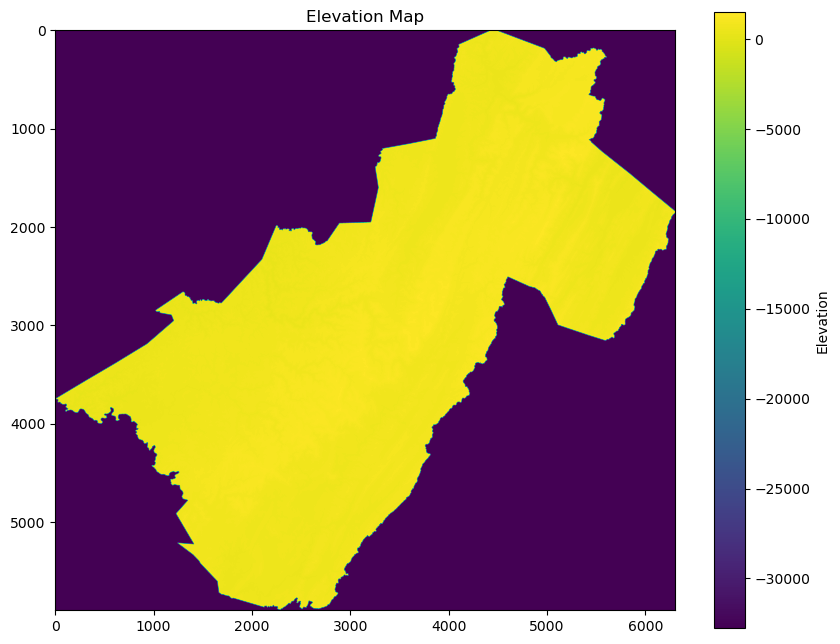

In [53]:
#map before masking
plt.rcParams['figure.figsize'] = [10, 8]
plt.imshow(elev_data.read(1), cmap='viridis')
plt.colorbar(label='Elevation')
plt.title('Elevation Map')
plt.show()

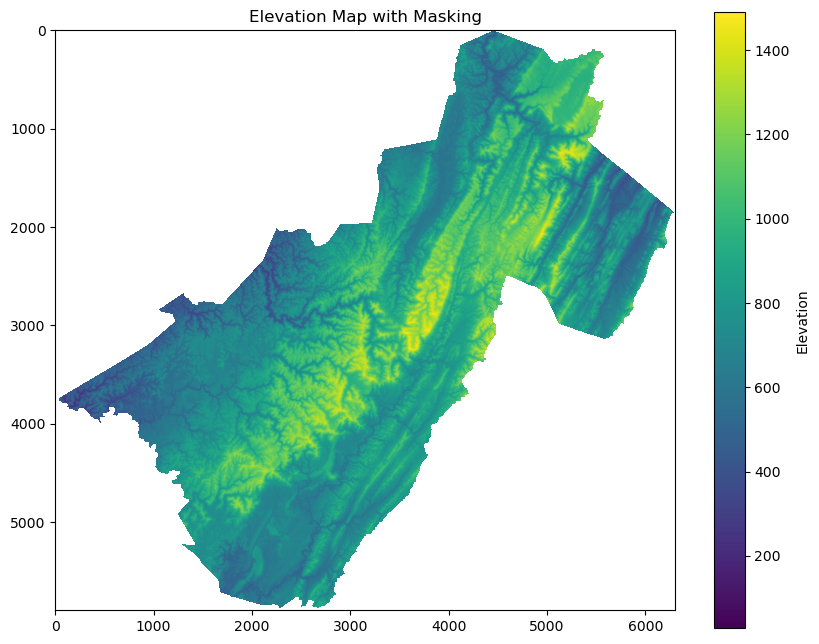

In [54]:
plt.rcParams['figure.figsize'] = [10, 8]
plt.imshow(image_read_masked, cmap='viridis')
plt.colorbar(label='Elevation')
plt.title('Elevation Map with Masking')
plt.show()

#### Task 5 

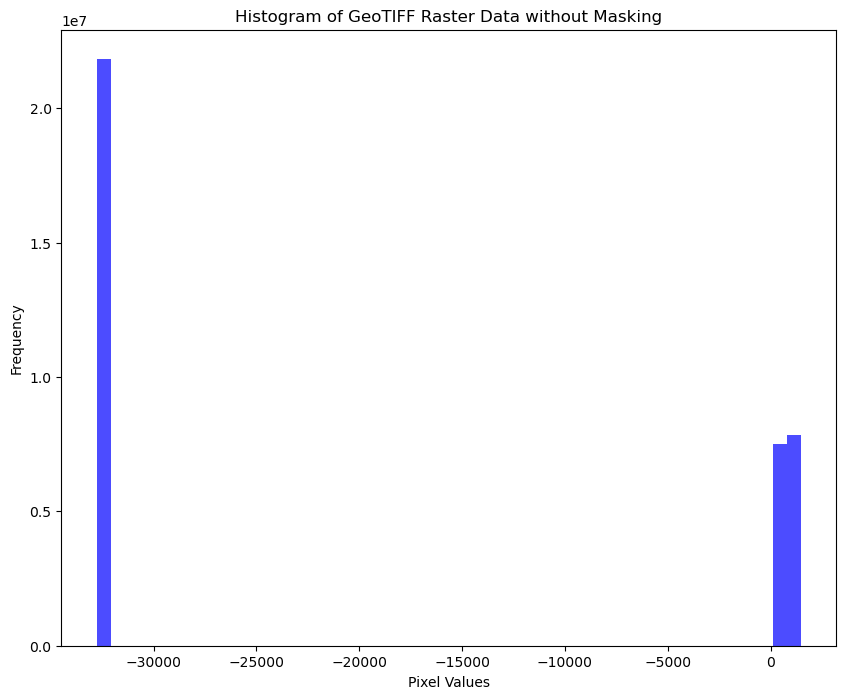

In [55]:
#histogram from the raster, before masking

import matplotlib.pyplot as plt
elev_path = '/arcgis/home/elev.tif'

with rio.open(elev_path) as src:
    raster_data = src.read(1)  #single-band raster
    
    
if np.ma.is_masked(raster_data):
    flat_data = raster_data.compressed()
else:
    flat_data = raster_data.flatten()

#final histogram design
plt.hist(flat_data, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of GeoTIFF Raster Data without Masking')
plt.xlabel('Pixel Values')
plt.ylabel('Frequency')
plt.show()

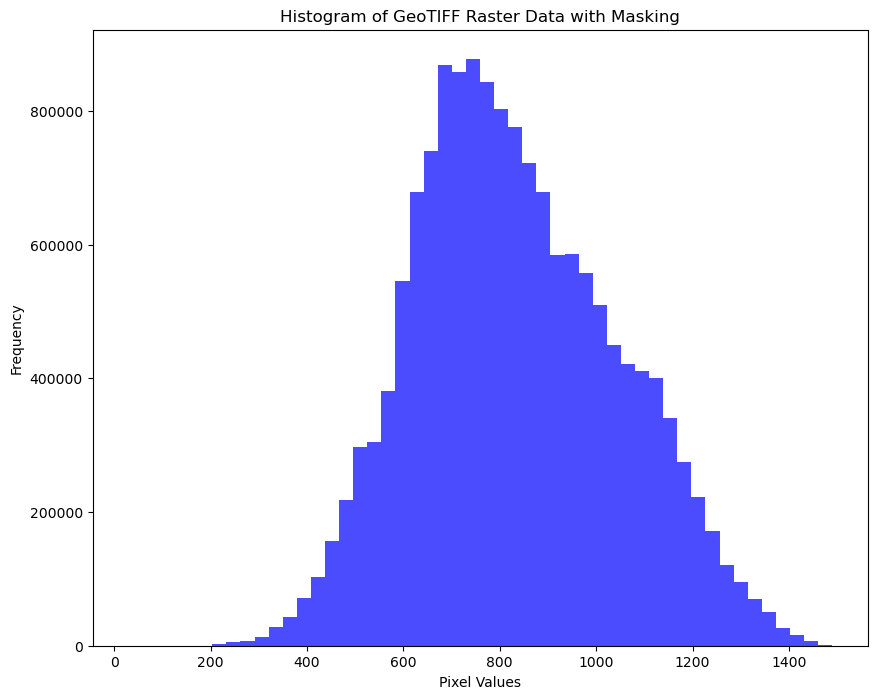

In [56]:
elev_path = '/arcgis/home/elev.tif'

with rio.open(elev_path) as src:
    # Read the raster data
    raster_data = src.read(1)  # Assuming a single-band raster; adjust the index if you have multiple bands

# Create a masked array
image_read_masked = np.ma.masked_array(raster_data, mask=(raster_data == -32768) | (raster_data < 0))

# Extract the non-masked values for the histogram
flat_data = image_read_masked.compressed()

# Create a histogram
plt.hist(flat_data, bins=50, color='blue', alpha=0.7)
plt.title('Histogram of GeoTIFF Raster Data with Masking')
plt.xlabel('Pixel Values')
plt.ylabel('Frequency')
plt.show()

### End of parts 1 to 5 of assignment 2